In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Define our imshow function
def imshow(title = "Image", image = None, size = 10):
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

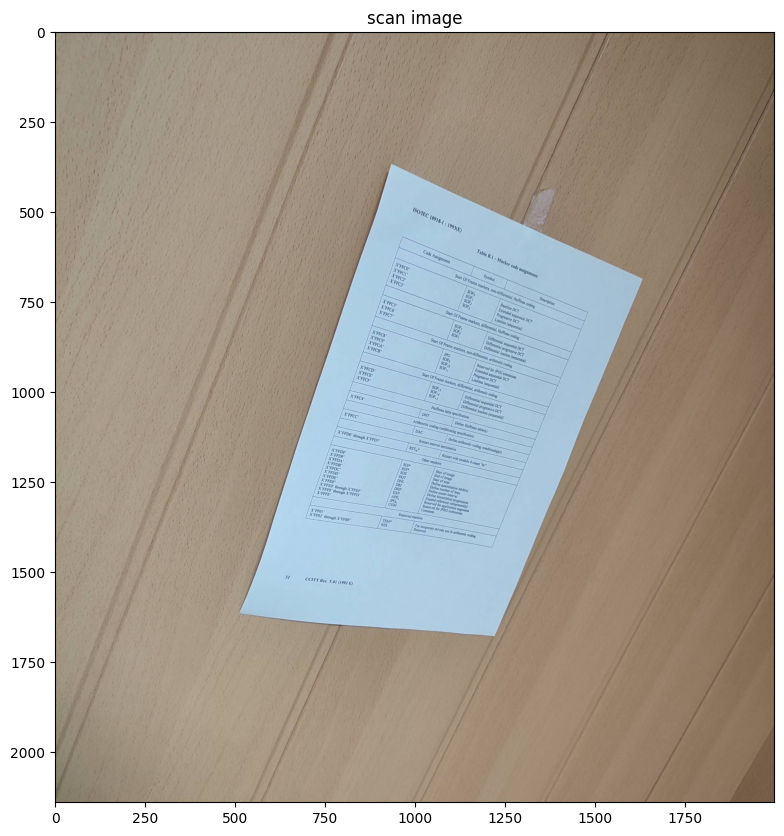

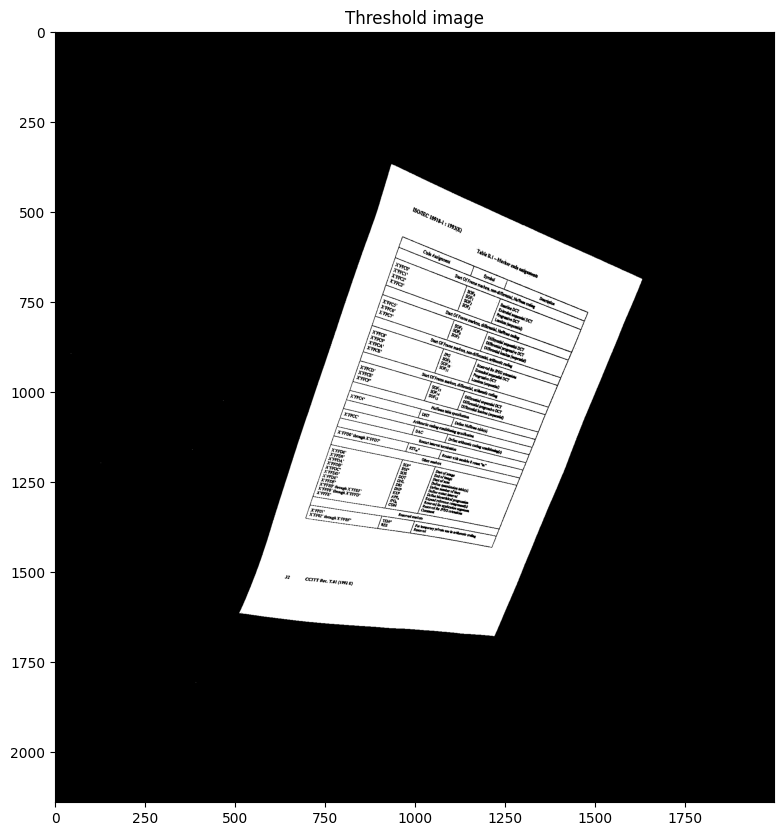

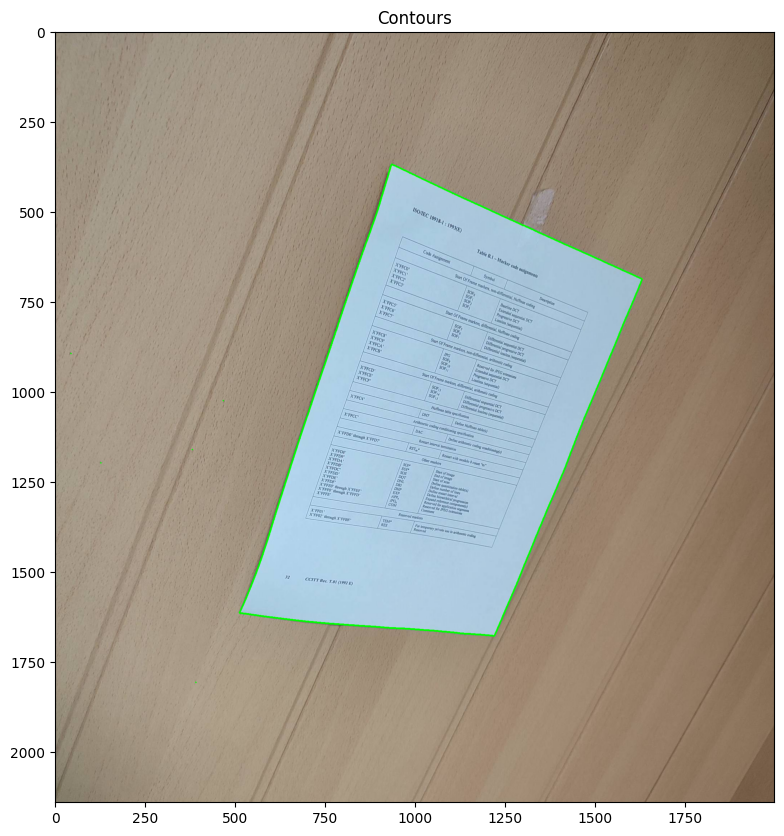

In [14]:
image = cv2.imread('/content/scan.jpg')
imshow('scan image', image)


# convert to gray scale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# thresholding

_, th = cv2.threshold(gray, 175, 255, cv2.THRESH_BINARY)
imshow('Threshold image', th)

th2 = th.copy()

# find contours

contours , hierarchy = cv2.findContours(th2,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# draw all contours
cv2.drawContours(image, contours, -1, (0,255, 0), 3)
imshow('Contours', image)



In [15]:
# sort contours from large to small

sorted_contours = sorted(contours, key=cv2.contourArea, reverse=True)

# loop over the contours
for cnt in sorted_contours:
	# approximate the contour
	perimeter = cv2.arcLength(cnt, True)
	approx = cv2.approxPolyDP(cnt, 0.05 * perimeter, True)

	if len(approx) == 4:
		break

# Our x, y cordinates of the four corners
print("Our 4 corner points are:")
print(approx)

Our 4 corner points are:
[[[ 935  367]]

 [[ 512 1614]]

 [[1220 1678]]

 [[1630  686]]]


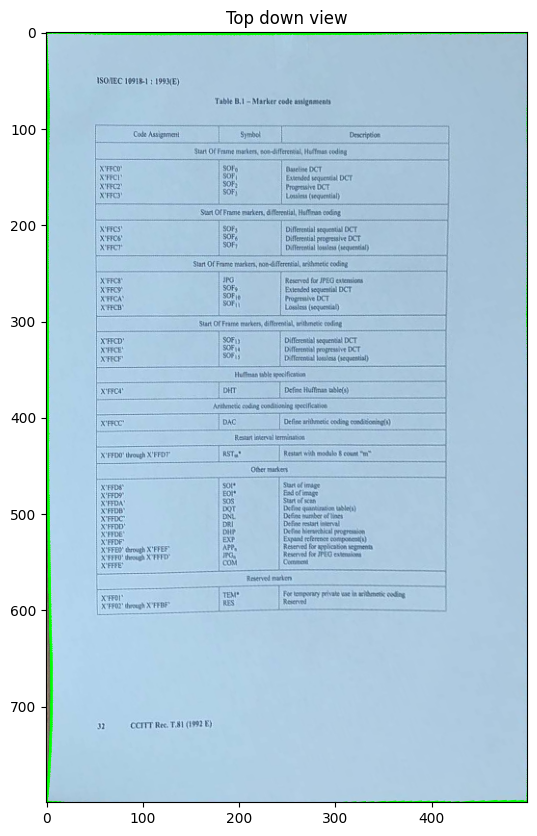

In [16]:
# change the image to top down view

inputPts = np.float32(approx)

outputPts = np.float32([[0,0],
                       [0,800],
                       [500,800],
                       [500,0]])

# perspective transform to find matrix M
M = cv2.getPerspectiveTransform(inputPts, outputPts)

# use warp perspective to apply matrix M to the image
dst = cv2.warpPerspective(image, M, (500,800))
imshow('Top down view', dst)

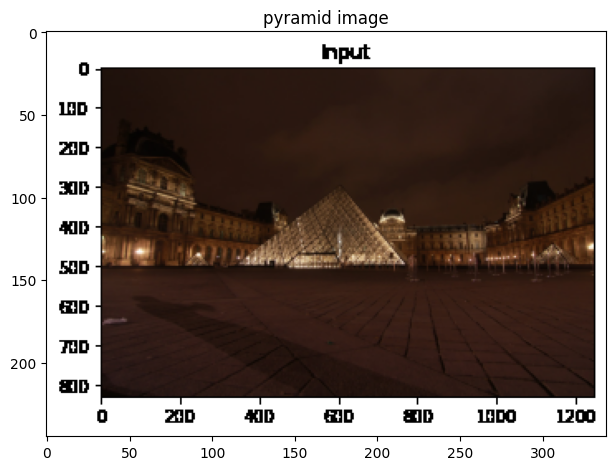

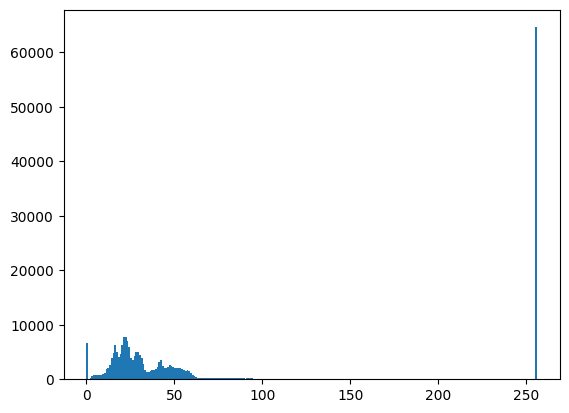

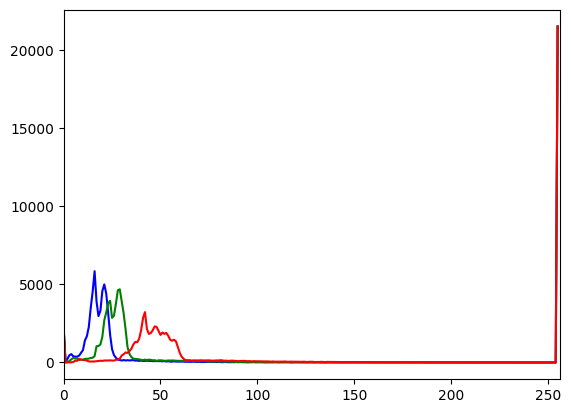

In [18]:
# load image

image = cv2.imread('/content/pyramid.jpg')
imshow('pyramid image', image)

# plot histogram
plt.hist(image.ravel(), 256, [0,256])
plt.show()

# viewing seperate color channels

color = ('b', 'g', 'r')

# seperate the colors and plot historgrams for each one

for i, col in enumerate(color):
  histr = cv2.calcHist([image], [i], None, [256], [0,256])
  plt.plot(histr, color = col)
  plt.xlim([0,256])
plt.show()

In [19]:
# K-means clustering to obtain dominant image colors

def centroidHistogram(clt):
    # Create a histrogram for the clusters based on the pixels in each cluster
    # Get the labels for each cluster
    numLabels = np.arange(0, len(np.unique(clt.labels_)) + 1)

    # Create our histogram
    (hist, _) = np.histogram(clt.labels_, bins = numLabels)

    # normalize the histogram, so that it sums to one
    hist = hist.astype("float")
    hist /= hist.sum()

    return hist

def plotColors(hist, centroids):
    # Create our blank barchart
    bar = np.zeros((100, 500, 3), dtype = "uint8")

    x_start = 0
    # iterate over the percentage and dominant color of each cluster
    for (percent, color) in zip(hist, centroids):
      # plot the relative percentage of each cluster
      end = x_start + (percent * 500)
      cv2.rectangle(bar, (int(x_start), 0), (int(end), 100),
        color.astype("uint8").tolist(), -1)
      x_start = end
    return bar

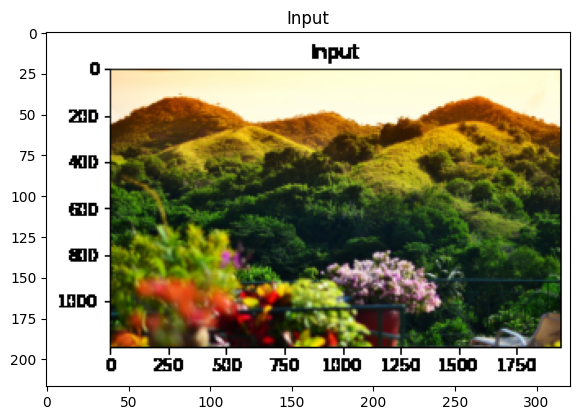

(217, 321, 3)
(69657, 3)


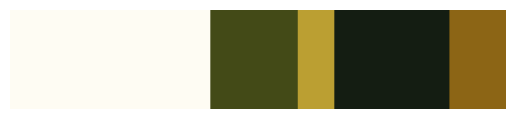

In [20]:
from sklearn.cluster import KMeans

image = cv2.imread('/content/mountain.jpg')
imshow("Input", image)

# We reshape our image into a list of RGB pixels
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
print(image.shape)
image = image.reshape((image.shape[0] * image.shape[1], 3))
print(image.shape)

number_of_clusters = 5
clt = KMeans(number_of_clusters)
clt.fit(image)

hist = centroidHistogram(clt)
bar = plotColors(hist, clt.cluster_centers_)

# show our color bart
plt.figure()
plt.axis("off")
plt.imshow(bar)
plt.show()

In [21]:
# MSE
def mse(image1, image2):
	# Images must be of the same dimension
	error = np.sum((image1.astype("float") - image2.astype("float")) ** 2)
	error /= float(image1.shape[0] * image1.shape[1])

	return error

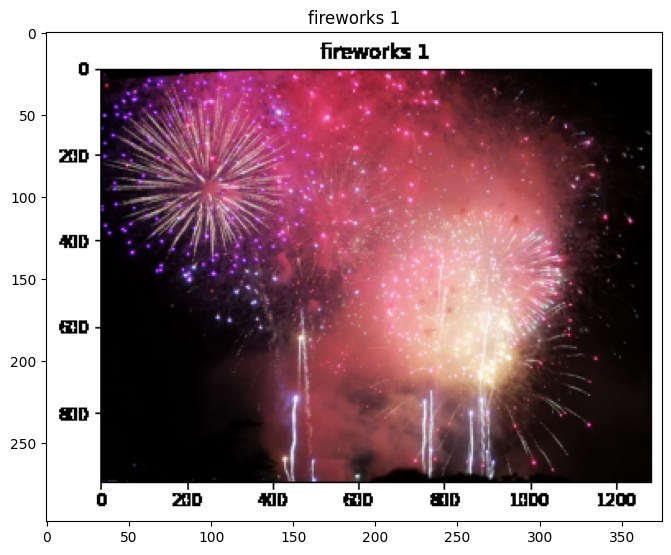

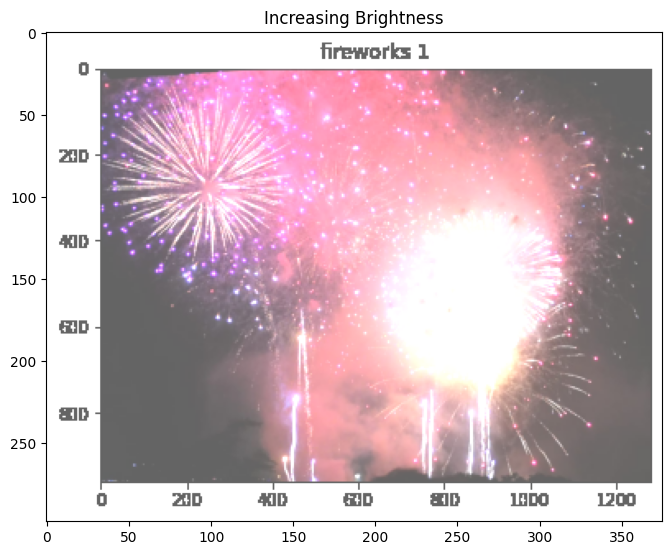

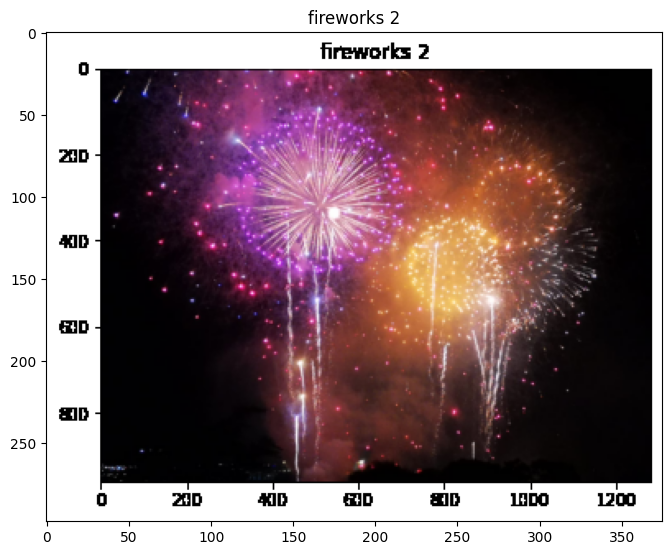

In [24]:
fireworks1 = cv2.imread('/content/fireworks1.jpg')
fireworks2 = cv2.imread('/content/fireworks2.jpg')

M = np.ones(fireworks1.shape, dtype = "uint8") * 100
fireworks1b = cv2.add(fireworks1, M)

imshow("fireworks 1", fireworks1)
imshow("Increasing Brightness", fireworks1b)
imshow("fireworks 2", fireworks2)

In [27]:
from skimage.metrics import structural_similarity
def compare(image1, image2):
  image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
  image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
  print('MSE = {:.2f}'.format(mse(image1, image2)))
  print('SS = {:.2f}'.format(structural_similarity(image1, image2)))

In [28]:
# When they're the same
compare(fireworks1, fireworks1)

MSE = 0.00
SS = 1.00


In [29]:
compare(fireworks1, fireworks2)

MSE = 1359.33
SS = 0.52


In [30]:
compare(fireworks1, fireworks1b)

MSE = 6865.52
SS = 0.62


In [31]:
compare(fireworks2, fireworks1b)

MSE = 10264.06
SS = 0.32


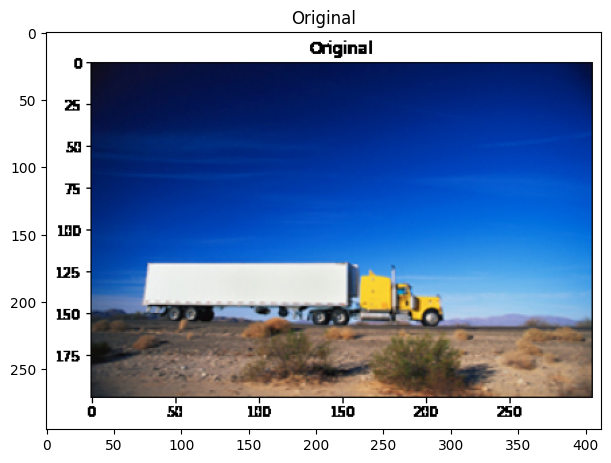

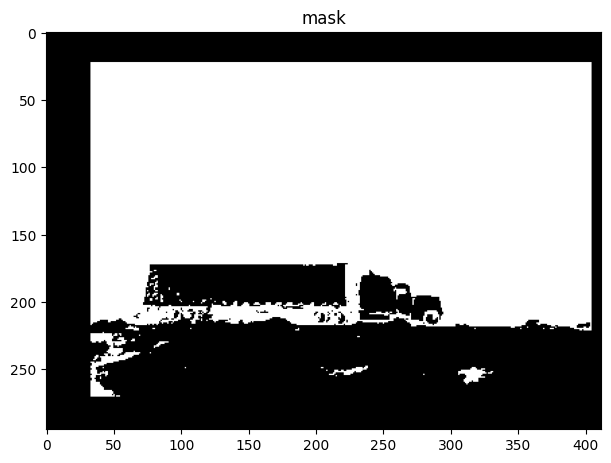

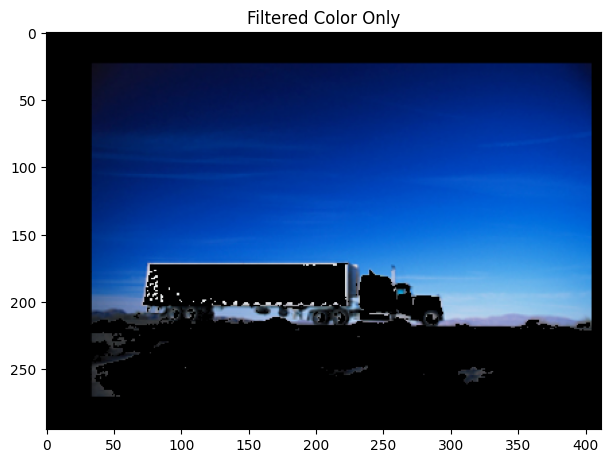

In [32]:
image = cv2.imread('/content/truck.jpg')

# define range of BLUE color in HSV
lower = np.array([90,0,0])
upper = np.array([135,255,255])

# Convert image from RBG/BGR to HSV so we easily filter
hsv_img = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Use inRange to capture only the values between lower & upper
mask = cv2.inRange(hsv_img, lower, upper)

# Perform Bitwise AND on mask and our original frame
res = cv2.bitwise_and(image, image, mask=mask)

imshow('Original', image)
imshow('mask', mask)
imshow('Filtered Color Only', res)

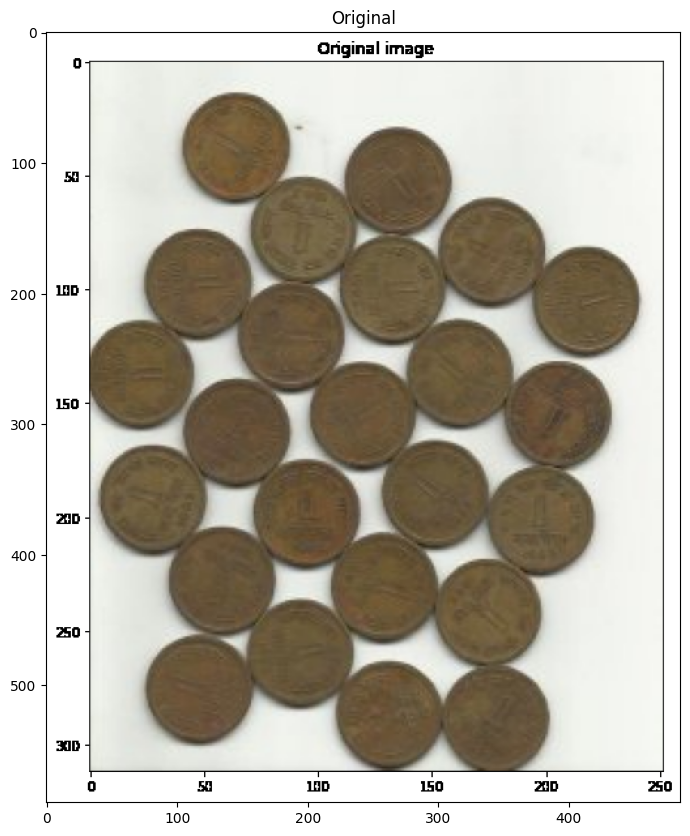

In [2]:
image = cv2.imread('/content/coins.jpg')
imshow('Original', image)

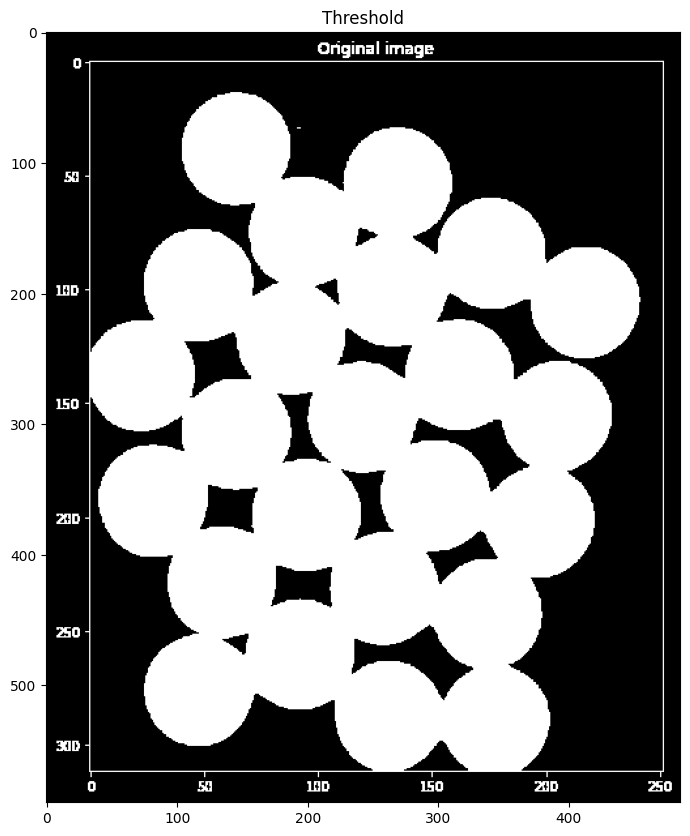

In [3]:
# converting image to gray scale and thresholding

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

ret, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

imshow('Threshold', thresh)

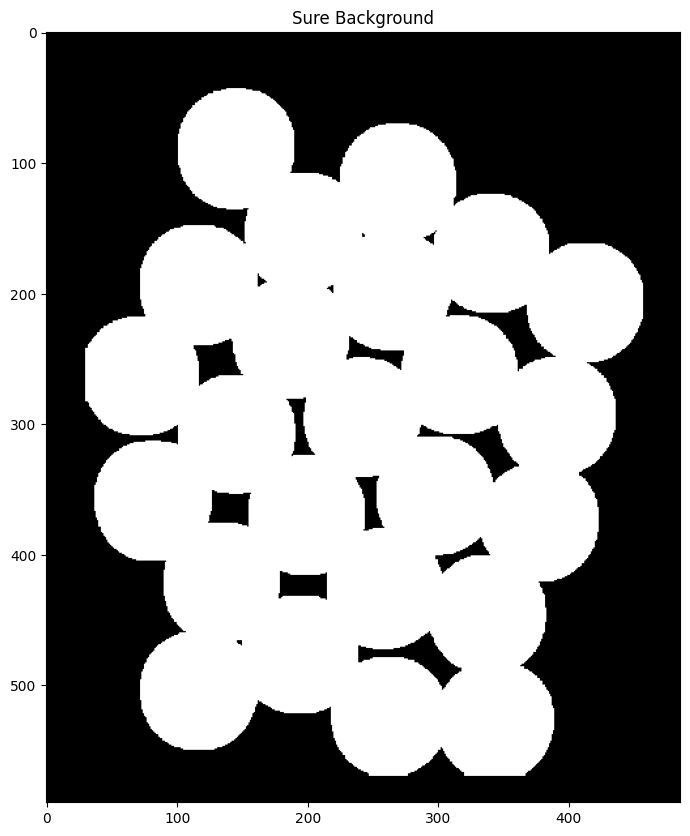

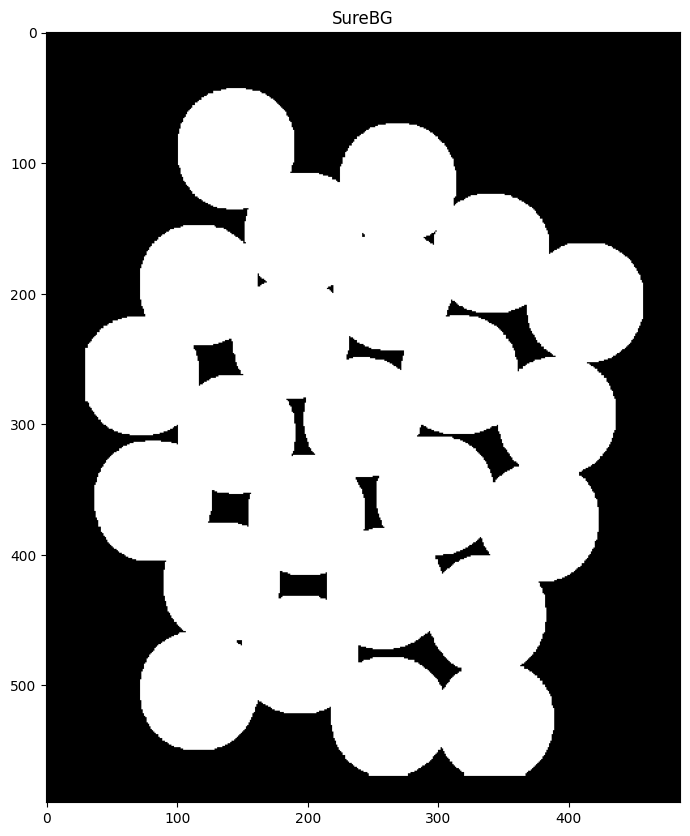

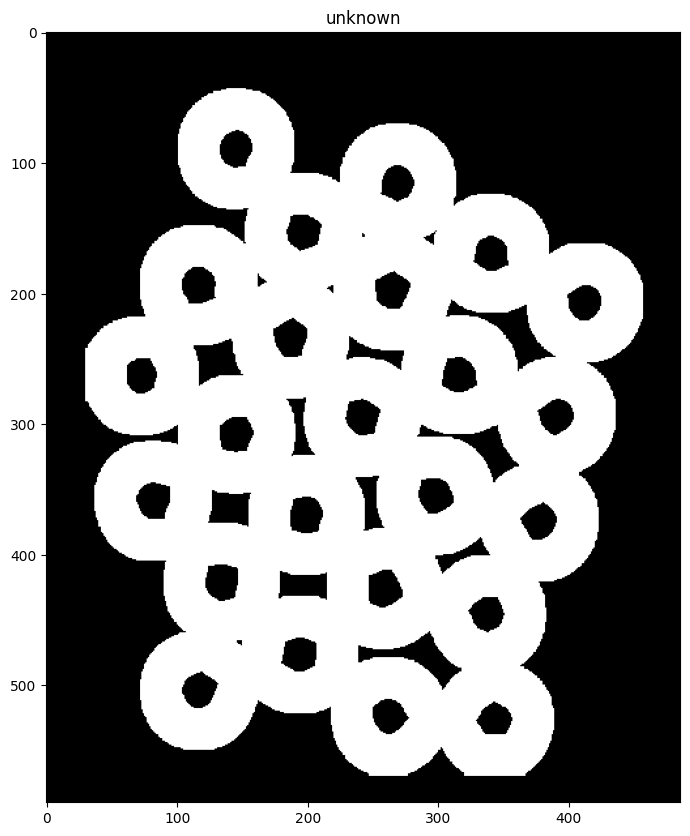

In [4]:
# noise removal
kernel = np.ones((3,3), np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN,kernel, iterations = 2)

# sure background area
sure_bg = cv2.dilate(opening, kernel, iterations=3)
imshow('Sure Background', sure_bg)

## Finding sure foreground area
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2,5)
ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg, sure_fg)

imshow("SureBG", sure_bg)
imshow("unknown", unknown)

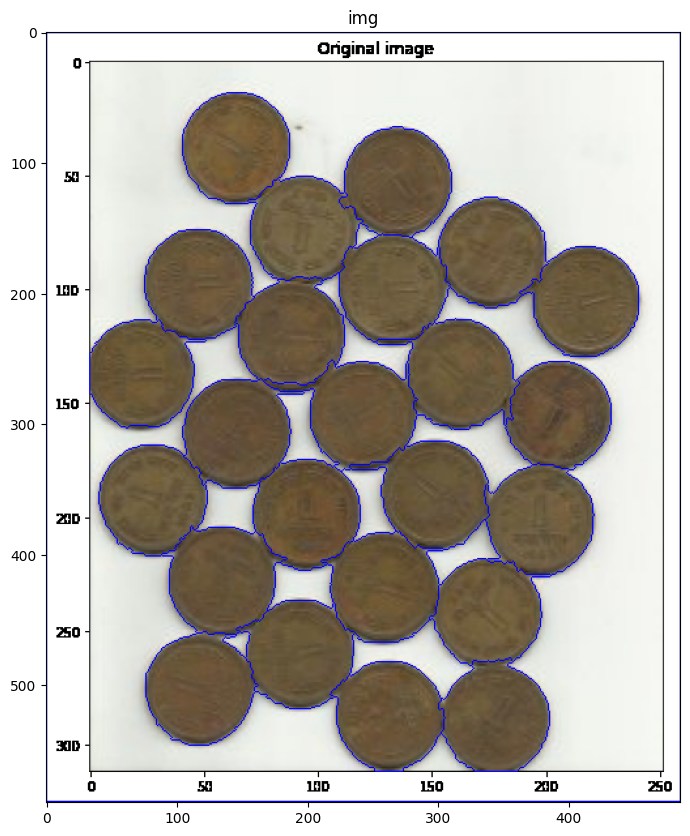

In [7]:
# Marker labelling
# Connected Components determines the connectivity of blob-like regions in a binary image.
ret, markers = cv2.connectedComponents(sure_fg)

# Add one to all labels so that sure background is not 0, but 1
markers = markers+1

# Now, mark the region of unknown with zero
markers[unknown==255] = 0

markers = cv2.watershed(image,markers)
image[markers == -1] = [255,0,0]

imshow("img", image)

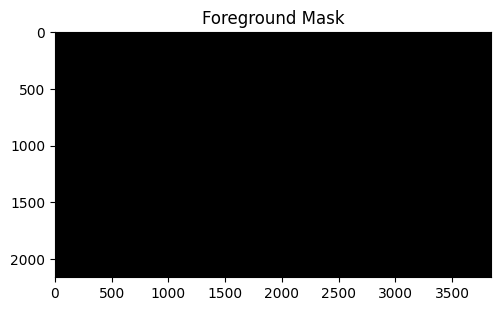

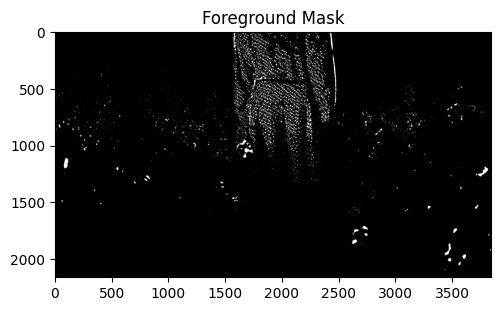

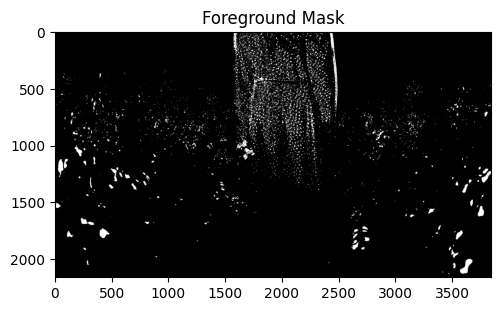

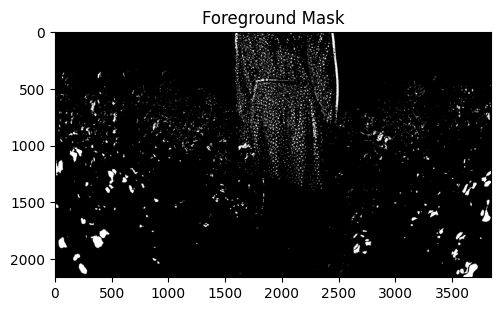

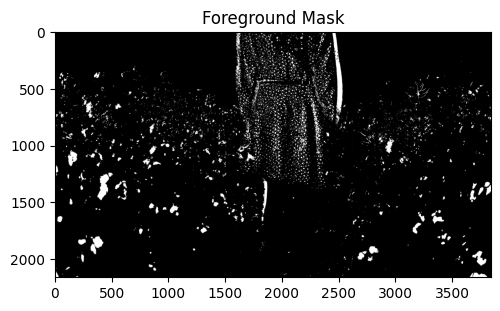

...

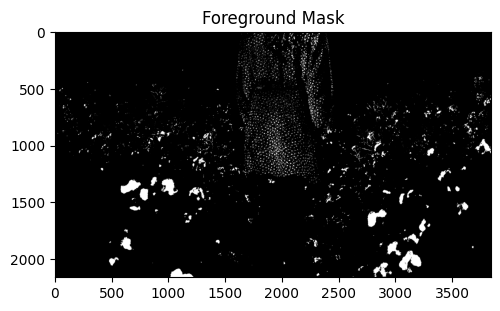

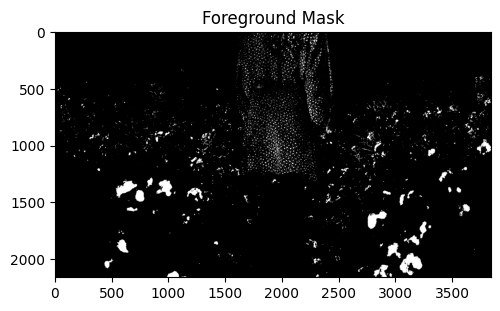

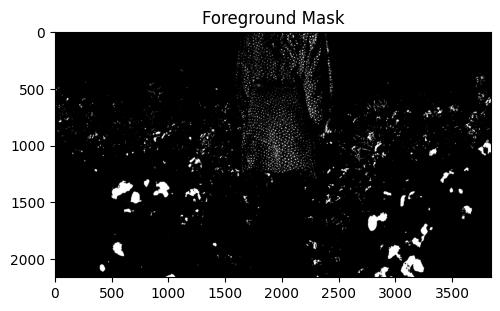

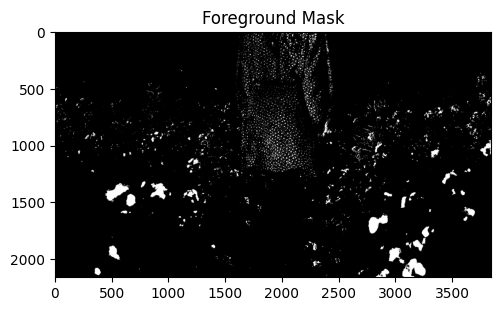

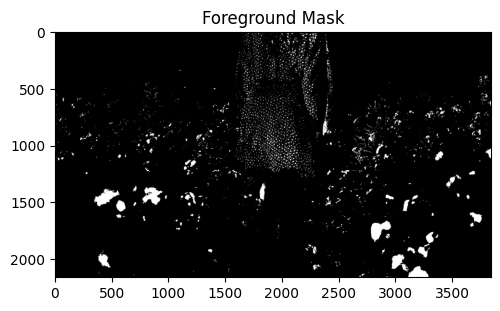

KeyboardInterrupt: 

In [4]:
cap = cv2.VideoCapture('/content/walking_clip.mp4')

# get height and width of the video for frame
w = int(cap.get(3))
h = int(cap.get(4))

# define codec and create VideoWriter object
out = cv2.VideoWriter('walking_output_GM.avi', cv2.VideoWriter_fourcc('M','J','P','G'), 30, (w, h))

# initialize the foregraound subtractor
foreground_background = cv2.bgsegm.createBackgroundSubtractorMOG()

while True :

  ret, frame = cap.read()
  if ret:
    foreground_mask = foreground_background.apply(frame)
    out.write(foreground_mask)
    imshow("Foreground Mask", foreground_mask)
  else:
    break

cap.release()
out.release()


In [ ]:
cap = cv2.VideoCapture('/content/walking_clip.mp4.')

# Get the height and width of the frame (required to be an interfer)
w = int(cap.get(3))
h = int(cap.get(4))

# Define the codec and create VideoWriter object.The output is stored in 'outpy.avi' file.
out = cv2.VideoWriter('walking_output_AGMM.avi', cv2.VideoWriter_fourcc('M','J','P','G'), 30, (w, h))

# Initlaize background subtractor
foreground_background = cv2.bgsegm.createBackgroundSubtractorGSOC()

# Loop once video is successfully loaded
while True:

    ret, frame = cap.read()
    if ret:
      # Apply background subtractor to get our foreground mask
      foreground_mask = foreground_background.apply(frame)
      out.write(foreground_mask)
      imshow("Foreground Mask", foreground_mask)
    else:
      break

cap.release()
out.release()